In [16]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image
from IPython.display import Video, display
import shutil

def load_data(pt_path):
    data = torch.load(pt_path, map_location="cpu")

    # if you saved a dict, pull mask_history; otherwise assume data _is_ the masks
    if isinstance(data, dict):
        masks = data.get("mask_history", None)
        if masks is None:
            raise ValueError(f"No 'mask_history' key found in {pt_path}")
    else:
        masks = data

    # turn list of tensors/arrays into a single numpy array
    if isinstance(masks, list):
        # list of T tensors or arrays
        cleaned = []
        for m in masks:
            if torch.is_tensor(m):
                cleaned.append(m.cpu().numpy())
            else:
                cleaned.append(np.array(m))
        masks = np.stack(cleaned, axis=0)

    # if it’s still a tensor, convert
    elif torch.is_tensor(masks):
        masks = masks.cpu().numpy()

    # now you have a numpy array of shape (T, H, W) or (T, 1, H, W)
    if masks.ndim == 4 and masks.shape[1] == 1:
        masks = masks[:, 0]   # drop channel dim

    return masks


def make_animation(masks, out_file, fps=5):
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.animation as animation

    # 1) ensure we're working with a numpy array
    masks = np.asarray(masks)

    # 2) drop any size-1 dimensions (so we go from e.g. (T,1,224,224) → (T,224,224))
    masks = masks.squeeze()

    # 3) if you only have one frame left, give it a fake time‐axis: (224,224) → (1,224,224)
    if masks.ndim == 2:
        masks = masks[np.newaxis, ...]

    # 4) sanity check
    if masks.ndim != 3:
        raise ValueError(f"Cannot animate masks with shape {masks.shape}; must be (T,H,W)")

    # now masks.shape == (T, H, W)
    T, H, W = masks.shape

    fig, ax = plt.subplots(figsize=(5, 5))
    im = ax.imshow(masks[0], cmap="viridis", vmin=0, vmax=1)
    ax.axis("off")

    def update(i):
        im.set_array(masks[i])
        return (im,)

    ani = animation.FuncAnimation(fig, update, frames=T, blit=True)
    # save as .mp4 (requires ffmpeg) or switch to .gif with PillowWriter
    if out_file.lower().endswith(".gif"):
        from matplotlib.animation import PillowWriter
        ani.save(out_file, writer=PillowWriter(fps=fps))
    else:
        ani.save(out_file, writer="ffmpeg", fps=fps)

    plt.close(fig)


def copy_loss_png(src_dir, prefix, dst_dir):
    """
    Copies prefix_loss.png from src_dir → dst_dir without invoking PIL.
    """
    src = os.path.join(src_dir, f"{prefix}_metrics.png")
    dst = os.path.join(dst_dir, f"{prefix}_metrics.png")

    if not os.path.isfile(src):
        print(f"[!] Loss PNG not found at {src}")
        return

    os.makedirs(dst_dir, exist_ok=True)
    shutil.copy(src, dst)
    print(f"Copied loss PNG → {dst}")



1f16ba81-25b5392a-794e99b6-4fa98d5b-5683c363_mask_history
Copied loss PNG → /Users/Kyra_1/Desktop/local_ADS_data/animations/1f16ba81-25b5392a-794e99b6-4fa98d5b-5683c363_metrics.png



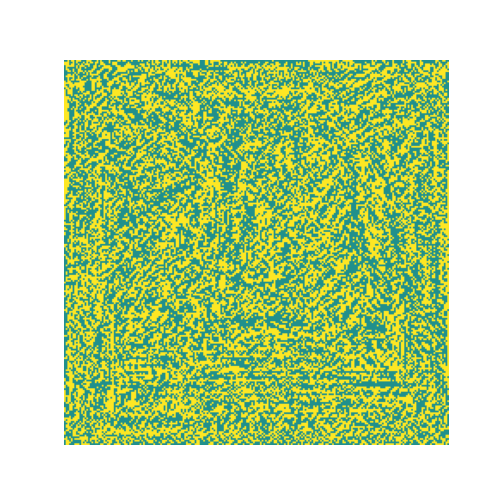

In [ ]:
# ← adjust these!
in_dir    = "/Users/Kyra_1/Desktop/local_ADS_data/necessary_sufficient"
#dicom_id  = "0ac242fc-5a45e0a3-9f749528-cecd3ef5-389d9eeb"
dicom_id = "1f16ba81-25b5392a-794e99b6-4fa98d5b-5683c363"
out_dir   = "/Users/Kyra_1/Desktop/local_ADS_data/animations"  
os.makedirs(out_dir, exist_ok=True)
dicom_id_filename = dicom_id+ '_mask_history'    

pt_path   = os.path.join(in_dir, f"{dicom_id_filename}.pt")
print(dicom_id_filename)
masks     = load_data(pt_path)

linger_frames = 5   # at 8 fps → 0.5 s pause
last_frame = masks[-1]
first_frame = masks[0]

# build a new stack with the repeats tacked on
masks_padded = np.concatenate([
    np.repeat(first_frame[None, ...], linger_frames, axis=0),
    masks,
    np.repeat(last_frame[None, ...], linger_frames, axis=0)
], axis=0)

anim_path = os.path.join(out_dir, f"{dicom_id}_mask_history.gif")
make_animation(masks_padded, anim_path, fps=7)

copy_loss_png(in_dir, dicom_id, out_dir)

# display inline
display(Video(anim_path, embed=True))


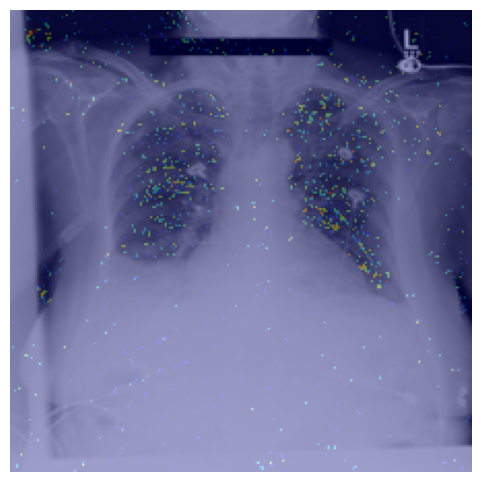

Saved overlay to /Users/Kyra_1/Desktop/local_ADS_data/animations/1f16ba81-25b5392a-794e99b6-4fa98d5b-5683c363_overlay.png


In [28]:
import os
import torch
import pydicom
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms

data_dir = '/Users/Kyra_1/Desktop/test_data/test_data'
prefix = dicom_id

# ─── 1) Load your final mask ─────────────────────────────────────────────────
# adjust filename if you saved it differently
final_mask_path = os.path.join(in_dir, f"{prefix}_final_mask.pt")
mask_data = torch.load(final_mask_path, map_location="cpu")

 
mask_np = mask_data.detach().cpu().squeeze().numpy()   # (H, W)

# ─── 2) Load & preprocess the original image ─────────────────────────────────
# assumes a DICOM named <prefix>.dcm in in_dir
dcm_path = os.path.join(data_dir, f"{prefix}.dcm")
ds = pydicom.dcmread(dcm_path, force=True)
arr = ds.pixel_array.astype("float32")
arr = (arr - arr.min()) / (np.ptp(arr) + 1e-6)
pil_img = Image.fromarray((arr * 255).astype("uint8"))

# resize-only transform to match mask size
resize_to_mask = transforms.Compose([
    transforms.Resize((mask_np.shape[0], mask_np.shape[1])),
    transforms.ToTensor()
])
img_tensor = resize_to_mask(pil_img)          # (C,H,W)
img_np     = img_tensor.squeeze().numpy()     # (H,W), values in [0,1]

# ─── 3) Plot & overlay ───────────────────────────────────────────────────────
plt.figure(figsize=(6,6))
plt.imshow(img_np, cmap="gray", vmin=0, vmax=1)
plt.imshow(mask_np, cmap="jet",  alpha=0.35)
plt.axis("off")

# ─── 4) Save to PNG ───────────────────────────────────────────────────────────
os.makedirs(out_dir, exist_ok=True)
overlay_path = os.path.join(out_dir, f"{prefix}_overlay.png")
plt.savefig(overlay_path, bbox_inches="tight", pad_inches=0)
plt.show()

print(f"Saved overlay to {overlay_path}")


## Only run the below if you are Kyra working off of an external drive

Loading: 1f16ba81-25b5392a-794e99b6-4fa98d5b-5683c363_mask_history
Copied loss PNG → /Volumes/Extra Storage/local_ADS_data/animations/1f16ba81-25b5392a-794e99b6-4fa98d5b-5683c363_metrics.png



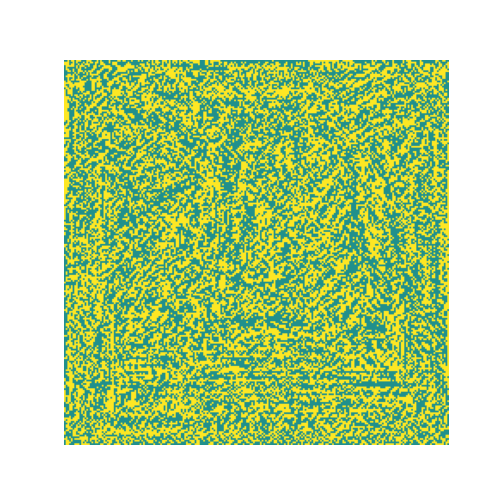

In [34]:
import os
import numpy as np
from IPython.display import Video

# ─── 1) Point everything at the Extra Storage drive ─────────────────────────
DRIVE_ROOT = "/Volumes/Extra Storage"
in_dir     = os.path.join(DRIVE_ROOT, "local_ADS_data", "necessary_sufficient")
out_dir    = os.path.join(DRIVE_ROOT, "local_ADS_data", "animations")
os.makedirs(out_dir, exist_ok=True)

# ─── 2) Which DICOM ID to process ───────────────────────────────────────────
dicom_id          = "1f16ba81-25b5392a-794e99b6-4fa98d5b-5683c363"
dicom_id_filename = f"{dicom_id}_mask_history"

# ─── 3) Load your .pt file ───────────────────────────────────────────────────
pt_path = os.path.join(in_dir, f"{dicom_id_filename}.pt")
print("Loading:", dicom_id_filename)
masks = load_data(pt_path)

# ─── 4) Pad first & last frames for linger effect ────────────────────────────
linger_frames = 5  # at 8 fps → 0.5 s pause
first_frame   = masks[0]
last_frame    = masks[-1]

masks_padded = np.concatenate([
    np.repeat(first_frame[None, ...], linger_frames, axis=0),
    masks,
    np.repeat(last_frame[None, ...], linger_frames, axis=0)
], axis=0)

# ─── 5) Build & save the GIF ─────────────────────────────────────────────────
anim_path = os.path.join(out_dir, f"{dicom_id}_mask_history.gif")
make_animation(masks_padded, anim_path, fps=7)

# ─── 6) Copy over the loss‐curve PNG and display inline ─────────────────────
copy_loss_png(in_dir, dicom_id, out_dir)
display(Video(anim_path, embed=True))


In [ ]:
import os
import torch
import pydicom
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms

# ─── Point everything at the Extra Storage drive ─────────────────────────────
DRIVE_ROOT    = "/Volumes/Extra Storage"
data_dir      = os.path.join(DRIVE_ROOT, "test_data", "test_data")
in_dir        = os.path.join(DRIVE_ROOT, "local_ADS_data", "necessary_sufficient")
out_dir       = os.path.join(DRIVE_ROOT, "local_ADS_data", "animations")  # or another folder if you prefer
os.makedirs(out_dir, exist_ok=True)

# ─── Use your existing dicom_id as the prefix ────────────────────────────────
prefix = dicom_id

# ─── 1) Load your final mask ─────────────────────────────────────────────────
final_mask_path = os.path.join(in_dir, f"{prefix}_final_mask.pt")
mask_data       = torch.load(final_mask_path, map_location="cpu")
mask_np         = mask_data.detach().cpu().squeeze().numpy()   # (H, W)

# ─── 2) Load & preprocess the original DICOM image ──────────────────────────
dcm_path = os.path.join(data_dir, f"{prefix}.dcm")
ds       = pydicom.dcmread(dcm_path, force=True)
arr      = ds.pixel_array.astype("float32")
arr      = (arr - arr.min()) / (np.ptp(arr) + 1e-6)
pil_img  = Image.fromarray((arr * 255).astype("uint8"))

# resize-only transform to match mask size
resize_to_mask = transforms.Compose([
    transforms.Resize((mask_np.shape[0], mask_np.shape[1])),
    transforms.ToTensor()
])
img_tensor = resize_to_mask(pil_img)        # (C,H,W)
img_np     = img_tensor.squeeze().numpy()   # (H,W), values in [0,1]

# ─── 3) Plot & overlay ───────────────────────────────────────────────────────
plt.figure(figsize=(6,6))
plt.imshow(img_np, cmap="gray", vmin=0, vmax=1)
plt.imshow(mask_np, cmap="jet",  alpha=0.35)
plt.axis("off")

# ─── 4) Save to PNG ───────────────────────────────────────────────────────────
overlay_path = os.path.join(out_dir, f"{prefix}_overlay.png")
plt.savefig(overlay_path, bbox_inches="tight", pad_inches=0)
plt.show()

print(f"Saved overlay to {overlay_path}")


FileNotFoundError: [Errno 2] No such file or directory: '/Volumes/Extra Storage/local_ADS_data/results/1f16ba81-25b5392a-794e99b6-4fa98d5b-5683c363_final_mask.pt'